# **Imports**

In [1]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import torch
import numpy as np
import detectron2
from detectron2 import model_zoo
from detectron2.utils.logger import setup_logger
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.engine import DefaultPredictor

In [2]:
if torch.cuda.is_available():
    device = 'gpu'
else:
    device = 'cpu'

# **Task 1: Plotting Raw Images**

From the COCO dataset I downloaded the validation 2017 images. Unfortuantly in the categorization name (annotation) of each image we don't have sky to seperate sky images from others. Therefore, I selected 12 images manually from the dataset which contains sky images.

In [19]:
# the path that selected images are available
folder_path = '../data/raw'
assert os.path.exists(folder_path), f'No such directory: {folder_path}'

Plotting the raw images to explore

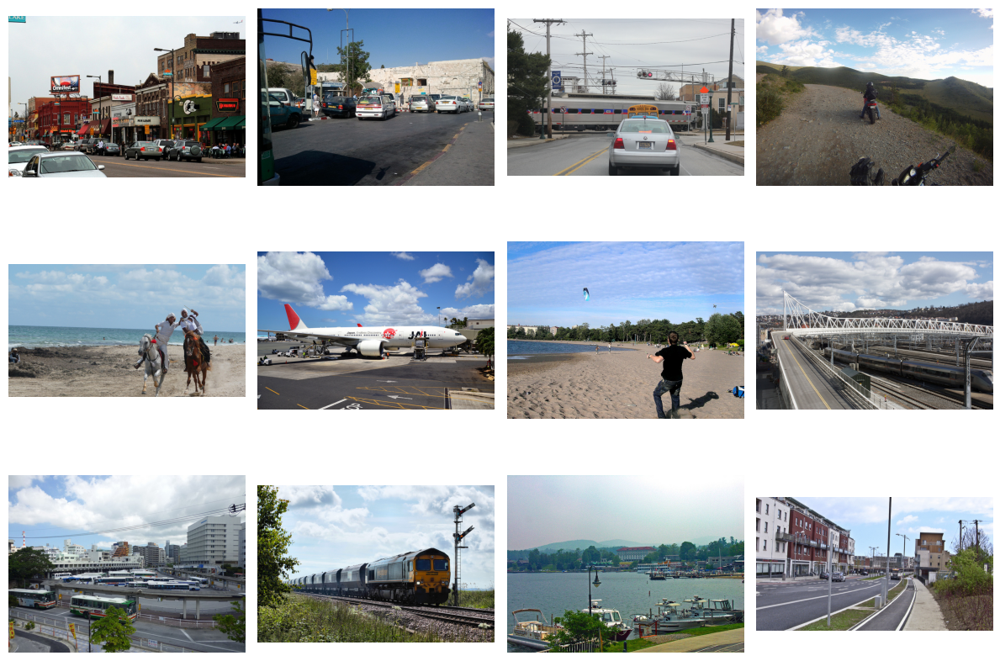

In [22]:
# Get list of all .jpg files
image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]

# Set grid dimensions to fit 12 images
rows = 3
cols = 4

fig = plt.figure(figsize=(12, 9))

# Loop over image files and add each to the subplot
for i, file in enumerate(image_files[:rows*cols]):
    img = Image.open(os.path.join(folder_path, file))
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(img)
    plt.axis('off')  # Turn off axis numbers and ticks

plt.tight_layout()  # Improve appearance
plt.show()


# **Task 2: Running instance segmentation using Detectron2**



[07/16 10:22:22 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


/Users/farazmoradi/miniconda3/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:3484.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


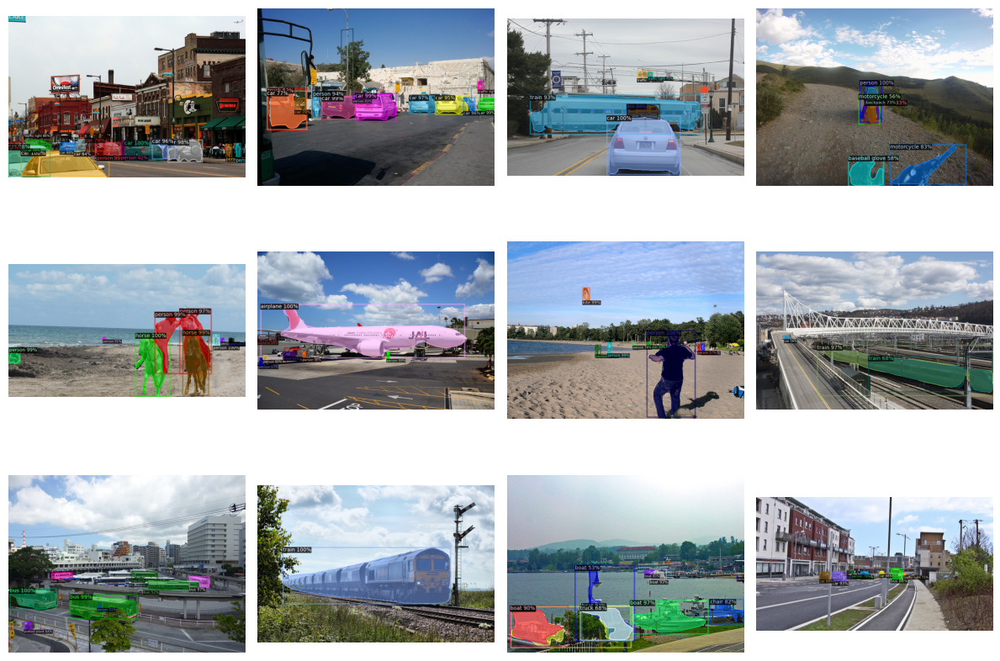

In [23]:
# Setup Detectron2 logger
setup_logger()


# Get list of all .jpg files
image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]

# Set grid dimensions to fit 12 images
rows = 3
cols = 4

# Load pre-trained model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.MODEL.DEVICE = device  # use CPU instead of GPU
predictor = DefaultPredictor(cfg)

fig = plt.figure(figsize=(12, 9))

# Run on each image
for i, file in enumerate(image_files[:rows*cols]):
    img_path = os.path.join(folder_path, file)
    img = Image.open(img_path)
    img_rgb = img.convert('RGB')
    img_rgb_np = np.array(img_rgb)  # convert image to numpy array

    # Make prediction
    outputs = predictor(img_rgb_np)  # input must be a numpy array, not torch tensor

    # Visualize
    v = Visualizer(img_rgb_np[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Add to subplot
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(v.get_image()[:, :, ::-1])  # convert BGR image to RGB for plotting
    plt.axis('off')  # Turn off axis numbers and ticks

plt.tight_layout()  # Improve appearance
plt.show()


# **Task 3: Removing sky from the images**

[07/16 10:22:46 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-PanopticSegmentation/panoptic_fpn_R_101_3x/139514519/model_final_cafdb1.pkl ...


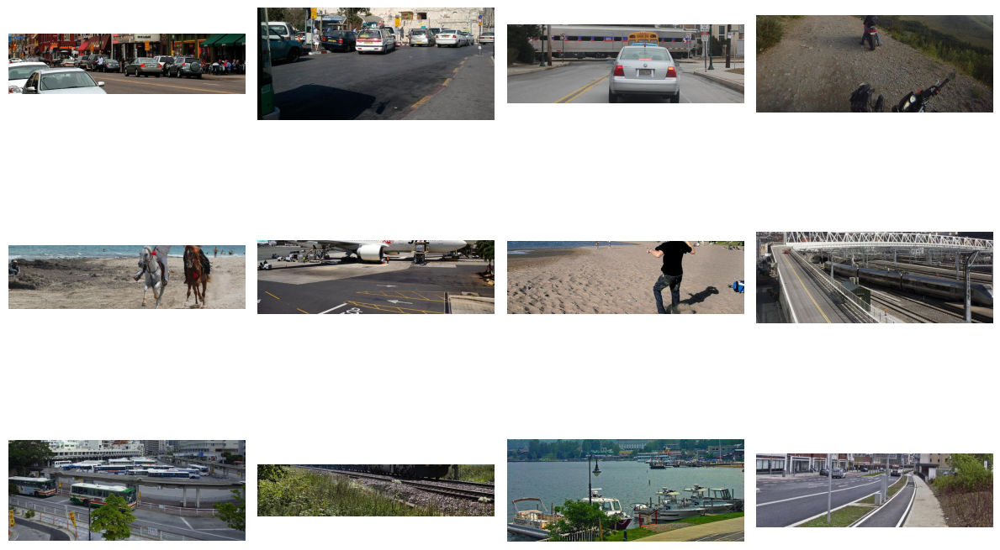

In [24]:
# Setup Detectron2 logger
setup_logger()

# Directory of images to run detection on
output_folder_path = '../data/processed'  # path to save cropped images

# Get list of all .jpg files
image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]

# Load pre-trained model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
cfg.MODEL.DEVICE = device  # use CPU instead of GPU
predictor = DefaultPredictor(cfg)

# Run on each image
for i, file in enumerate(image_files):
    img_path = os.path.join(folder_path, file)
    img = Image.open(img_path)
    img_rgb = img.convert('RGB')
    img_rgb_np = np.array(img_rgb)

    # Make prediction
    outputs = predictor(img_rgb_np)

    # Get the 'sky' mask
    sky_mask = None
    for segment_info in outputs['panoptic_seg'][1]:
        if segment_info['category_id'] == 40:  # 40 is the category_id for 'sky' in COCO
            sky_mask = (outputs['panoptic_seg'][0].cpu().numpy() == segment_info['id'])
            break

    # If sky is detected, remove the sky and save the image
    if sky_mask is not None:
        # Find the bottom of the sky
        sky_bottom = np.max(np.argwhere(sky_mask)[:, 0])
        # Crop the image below the sky
        cropped_img = img_rgb_np[sky_bottom:]
        cropped_img_pil = Image.fromarray(cropped_img)
        cropped_img_pil.save(os.path.join(output_folder_path, file))

# Get list of all .jpg files
image_files = [f for f in os.listdir(output_folder_path) if f.endswith('.jpg')]

# Set grid dimensions to fit 12 images
rows = 3
cols = 4

fig = plt.figure(figsize=(12, 9))

# Loop over image files and add each to the subplot
for i, file in enumerate(image_files[:rows*cols]):
    img = Image.open(os.path.join(output_folder_path, file))
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(img)
    plt.axis('off')  # Turn off axis numbers and ticks

plt.tight_layout()  # Improve appearance
plt.show()


# **Task 4: Plotting original and cropped image**

[07/16 10:23:06 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


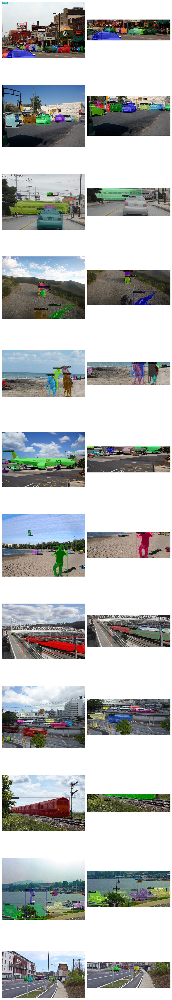

In [25]:
# Setup Detectron2 logger
setup_logger()

# Get list of all .jpg files
image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]

# Load pre-trained model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.DEVICE = device  # use CPU instead of GPU
predictor = DefaultPredictor(cfg)

fig, axs = plt.subplots(len(image_files), 2, figsize=(10, len(image_files) * 5))

# Run on each image
for i, file in enumerate(image_files):
    # Open original image
    img_path = os.path.join(folder_path, file)
    img = Image.open(img_path)
    img_rgb = img.convert('RGB')
    img_rgb_np = np.array(img_rgb)
    outputs = predictor(img_rgb_np)
    v = Visualizer(img_rgb_np[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    axs[i, 0].imshow(v.get_image()[:, :, ::-1])
    axs[i, 0].axis('off')

    # Open cropped image
    cropped_img_path = os.path.join(output_folder_path, file)
    cropped_img = Image.open(cropped_img_path)
    cropped_img_rgb = cropped_img.convert('RGB')
    cropped_img_rgb_np = np.array(cropped_img_rgb)
    outputs = predictor(cropped_img_rgb_np)
    v = Visualizer(cropped_img_rgb_np[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    axs[i, 1].imshow(v.get_image()[:, :, ::-1])
    axs[i, 1].axis('off')
    


plt.tight_layout()
plt.show()
